
# Track 2: Quantum Optimization for Impact

## Introduction to Knapsack Problem
The knapsack problem is a combinatorial optimization task that involves selecting a subset of items from a larger collection. The objective is to maximize the total value of the selected items, subject to the constraint that their combined weight does not surpass a predefined capacity, known as the *knapsack*.
### Problem
Optimizing the allocation of budget for the best overall societal outcome is a difficult task because of multiple sectors with the limited budget. Mixing budget to several sources require identifying the optimum combination returning best overall value. The problem shifts from simply funding needs to maximizing the "return on investment" for social good. This requires an optimization model that can find out optimum budget allocated to each sector with the best social impact. We can model this problem as a *Knapsack* problem and use *Quantum Approximate Optimization Algorithm (QAOA)* to find out the best solution.

We have simulated a budget allocation problem with some dummy data with societal impact score for each sector.
Imagine we are managing a $100,000 grant budget and we must choose among several nonprofit projects. Each project has:

- A cost (how much funding it requires)

- An impact score (how much good it does)

Our goal: maximize total impact without exceeding the budget.

### Project candidates

We create a imagination data from chat gpt:
| Emoji | Project Name           | Cost (k$) | Impact Score |
|-------|------------------------|-----------|---------------|
| 🚰    | Clean Water            | 30        | 80            |
| 📖    | Literacy Program       | 20        | 50            |
| 🔋    | Renewable Energy       | 50        | 120           |
| 🍽️    | Food Security          | 40        | 70            |
| 🧠    | Mental Health          | 10        | 30            |
| 🌳    | Urban Greening         | 25        | 65            |
| 🎓    | STEM Education         | 35        | 90            |
| 🏥    | Mobile Clinics         | 45        | 110           |
| 🧪    | Disease Research       | 15        | 40            |
| 🎭    | Arts Access            | 10        | 25            |
| 🧼    | Hygiene Kits           | 12        | 35            |
| 🌍    | Climate Action         | 38        | 95            |
| 📡    | Rural Internet         | 22        | 60            |
| 🚸    | Child Safety           | 18        | 45            |
| 🧯    | Fire Prevention        | 20        | 55            |
| 📦    | Disaster Relief        | 8         | 20            |
| 🧃    | School Nutrition       | 5         | 15            |
| 🧩    | Disability Inclusion   | 30        | 85            |
| 🧤    | Winter Clothing        | 4         | 10            |
| 🧬    | Genetic Health Equity  | 28        | 75            |


**Total budget: $100k**

**Optimize: Budget Impact Score**

### Our approach

In our solution, we will start by tackling a smaller 5-project problem before addressing the full-scale problem. First, we will attempt to solve the combinatorial problem using classical methods and demonstrate their limitations as the number of projects increases on classical computers. To go beyond these limitations, we will use the Quantum Approximate Optimization Algorithm (QAOA) to solve the combinatorial optimization problem.

For this, we translate combinatorial optimization problems into the Quadratic Unconstrained Binary Optimization (QUBO) formulation. To map them onto quantum computers, we will use two common methods for encoding inequality constraints: slack variables and unbalanced penalization. The slack variable method is the most common, but it requires an extended number of qubits. We will show that the unbalanced penalization method is more efficient and better suited for larger-scale systems.

This jupiter notebook is inspired from the work [4].


## Installation



In this notebook, we need to install `openqaoa`. The advantage is that it provides a pre-implemented Knapsack model and allows us to apply unbalanced penalization easily. It is important to note that, as of September 2025, `openqaoa` is not compatible with Python versions higher than 3.10. 

In [ ]:
# conda create -n openqaoa-env python=3.10
# conda activate openqaoa-env
# conda install numpy sympy
# pip install qiskit qiskit-aer openqaoa
# pip install pylatexenc

In [17]:
import qiskit
import qiskit_aer
print(qiskit.__version__)
print(qiskit_aer.__version__)

2.1.2
0.17.1


## 5-projects problem

### Solving classically (Brute Force)


First, we will create the input data. It is worth noting that the problem becomes easier when the values are balanced, meaning there is no large gap between the smallest and largest values. To achieve this, we can scale the units to reduce the values, for example dividing the budget by 1000. Otherwise, representing each value would require a large number of qubits, which is costly to solve.

In [2]:
items_values = {
    "🚰": 80,   # Clean Water
    "📖": 50,   # Literacy Program
    "🔋": 120,  # Renewable Energy
    "🍽️": 70,  # Food Security
    "🧠": 30    # Mental Health
}

items_weight = {
    "🚰": 30,
    "📖": 20,
    "🔋": 50,
    "🍽️": 40,
    "🧠": 10
} # Budget in dollars (x10^3)

values_list = [80, 50, 120, 70, 30] # Impact value of each project
weights_list = [30, 20, 50, 40, 10] # Budget in dollars (x10^3)
maximum_weight = 100  # Budget in dollars (x10^3)

n_items = len(values_list)   #calcualtes the length of the projects

We now have a well-defined optimization problem. As a baseline, we begin with a brute-force approach that evaluates all possible combinations of items. Since each of the $n$ items can either be included (“1”) or excluded (“0”), the total number of combinations is $2^n$. For example, with 
$𝑛=5$, we obtain $2^5=32$ possible combinations. For each combination, we compute the total value and total weight, then identify the one that satisfies the weight constraint while maximizing the total value.

In [3]:
import numpy as np

def sum_weight(bitstring, items_weight):    # Calculates the total weight of items selected by the bitstring.
    weight = 0
    for n, i in enumerate(items_weight):
        if bitstring[n] == "1":
            weight += i
    return weight


def sum_values(bitstring, items_value):  #
    value = 0
    for n, i in enumerate(items_value):
        if bitstring[n] == "1":
            value += i
    return value

def classical_combinations(items_values, weights_list, values_list, maximum_weight):
    items = list(items_values.keys())
    n_items = len(items)
    combinations = {}
    max_value = 0
    for case_i in range(2**n_items):  # all possible options for given n number of projects
        combinations[case_i] = {}
        bitstring = np.binary_repr(
            case_i, n_items
        )  # bitstring representation of a possible combination, e.g, "01100" in our problem means bringing (-💻📸--)
        combinations[case_i]["items"] = [items[n] for n, i in enumerate(bitstring) if i == "1"]
        combinations[case_i]["value"] = sum_values(bitstring, values_list)
        combinations[case_i]["weight"] = sum_values(bitstring, weights_list)
        # save the information of the optimal solution (the one that maximizes the value while respecting the maximum weight)
        if (
            combinations[case_i]["value"] > max_value
            and combinations[case_i]["weight"] <= maximum_weight
        ):
            max_value = combinations[case_i]["value"]
            optimal_solution = {
                "items": combinations[case_i]["items"],
                "value": combinations[case_i]["value"],
                "weight": combinations[case_i]["weight"],
            }
    return optimal_solution

optimal_solution = classical_combinations(items_values, weights_list, values_list, maximum_weight)
print(
    f"The best combination is {optimal_solution['items']} with a total value: {optimal_solution['value']} and total weight {optimal_solution['weight']} "
)

The best combination is ['🚰', '📖', '🔋'] with a total value: 250 and total weight 100 


As shown, the best combination from the 5 projects is “Clean Water,” “Literacy Program,” and “Renewable Energy”, yielding a total value of 250 within a budget of $100K. This result can be easily obtained using classical algorithms.

In [4]:
def time_to_solution(n, time_single_case):
    """
        n (int): number of variables
        time_single_case (float): time to solve a single case
    """
    return time_single_case * 2 ** n

time_per_case = 1e-9 # time to execute a single case in seconds
sec_day = 3600 * 24 # seconds in a day
sec_year = sec_day * 365 # seconds in a year

print(
    f"- For 10 items, 2^10 cases, we need {time_to_solution(2, time_per_case)} seconds."
)
print(
    f"- For 50 items, 2^50 cases, we need {round(time_to_solution(50, time_per_case) / sec_day)} days."
)
print(
    f"- For 100 items, 2^100 cases, we need {round(time_to_solution(100, time_per_case) / sec_year)} years."
)

- For 10 items, 2^10 cases, we need 4e-09 seconds.
- For 50 items, 2^50 cases, we need 13 days.
- For 100 items, 2^100 cases, we need 40196936841331 years.


As we can see this classical method cannot be scaled as the number of items increases. The time for solution increases exponentially. We have to find a better way to solution for ths problem as the number of items increases.

In order to use the power of quantum computing, we have to first define this problem in required format.

For our problem, if we write it objective function, it can be written as:
$$\min_{x} = -(80 x_0 + 50 x_1 + 120 x_2 + 70x_3 + 30 x_4)$$
Here, we have (-) sign infront of the equation as the optimization finds the minimum value for the combination but in this problem, we aim to maximize the Impact Value.


We can write our equation above using the general form of the **QUBO representation**, i.e., using an upper triangular matrix $Q \in \mathbb{R}^{n \times n}$:

$$
\min_{x} \mathbf{x}^T Q \mathbf{x} = \min_{x} \left( \sum_{i} \sum_{j \ge i} Q_{ij}x_i x_j \right) = \min_{x} \left( \sum_{i} Q_{ii}x_i + \sum_{i<j} Q_{ij}x_i x_j \right)
$$

where $\mathbf{x}$ is a vector representing the items of our problem.  $\mathbf{x}^T $ is the transpose of $\mathbf{x}$ and $\mathbf{Q}$ is the diagonal matrix containing the impact values for each project.

Similarly, we can check to solve the QUBO classicaly if we obtain the same result:

In [5]:
def classical_QUBO(items_values, optimal_solution):
    Q = -np.diag(list(items_values.values()))  # Matrix Q for the problem above.
    x_opt = np.array(
        [[1 if i in optimal_solution["items"] else 0] for i in items_values.keys()]
    )  # Optimal solution.
    opt_str = "".join(str(i[0]) for i in x_opt)
    min_cost = (x_opt.T @ Q @ x_opt)[0, 0] # Minimum cost.

    return Q, x_opt, min_cost

Q, x_opt, min_cost = classical_QUBO(items_values, optimal_solution)
print(f"Q={Q}")
print(f"The minimum cost is  {min_cost}")

Q=[[ -80    0    0    0    0]
 [   0  -50    0    0    0]
 [   0    0 -120    0    0]
 [   0    0    0  -70    0]
 [   0    0    0    0  -30]]
The minimum cost is  -250


Luckily, we re-obtain the minimum cost, 250. In many cases, the solution is not satisfied the constraint by solving this way. The constraint is that the budget can not be higher than $100k meaning :

$$30 x_0 + 20 x_1 + 50 x_2 + 40 x_3 + 10 x_4 \leq 100$$

At this stage, a key challenge is integrating the objective function with the *inequality constraint*. A typical strategy is to add a penalty term to the objective function. This penalty is designed to be zero when the total weight of the items does not exceed 100, and large when the constraint is violated. To achieve this, the standard practice is to introduce **slack variables**. Another approach, called unbalanced penalization, has been found to yield better performance, and we will discuss this method later.


#### Slack variables

The slack variable is an auxiliary variable that allows us to convert inequality constraints into equality constraints. The slack variable $S$ 
 represents the amount by which the left-hand side of the inequality falls short of the right-hand side. If the left-hand side is less than the right-hand side, then $S$ will be positive and equal to the difference between the two sides [2-4]:

 $$30 x_0 + 20 x_1 + 50 x_2 + 40 x_3 + 10 x_4 + S= 100$$

 where $0\leq S \leq 100$. We can see that: 
 - When the total value is 250 and the total weight is 100 (the classical solution), we have S=0 because the constraint is exactly satisfied. This explains why solving with or without explicitly adding constraints yields the same result, although such cases are rare. We demonstrate it in the next cell.
 - When $$30 x_0 + 20 x_1 + 50 x_2 + 40 x_3 + 10 x_4 < 100$$, then $S=100-(30 x_0 + 20 x_1 + 50 x_2 + 40 x_3 + 10 x_4)$, so $S$ is possitive.
 - When $$30 x_0 + 20 x_1 + 50 x_2 + 40 x_3 + 10 x_4 > 100$$, then $S=100-(30 x_0 + 20 x_1 + 50 x_2 + 40 x_3 + 10 x_4)$, so $S$ is negative.

The role of $S$ is to balance the formulation and ensure that the inequality constraint is respected.

In order to encode $S$, we need to represent it in binary form:
$$S=\sum_{k=0}^{N-1}2^ks_k=2^0s_0+2^1s_1+2^2s_2+2^3s_3+2^4s_4+2^5s_5+2^6s_6=1s_0+2s_1+4s_2+8s_3+16s_4+32s_5+64s_6$$

where $N=\log_2(\max S)+1$, and $0\leq S\leq 100\to \max S=100$, thus, $N=\log_2(100)+1\approx 7$. 

As said, we would like to add inequality contraint to objective function, thus it is nessary to introduce $s_k$ ($k \in[0,4]$) as the new variables $x_{i>5}$ ($i \in[5,11]$):
$$S=1s_5+2s_6+4s_7+8s_8+16s_9+32s_{10}+64s_{11}$$

The last step is to add the penalty term, a usual choice for it is to use a quadratic penalty:
$$p(\lambda, x, s)=\lambda(30 x_0 + 20 x_1 + 50 x_2 + 40 x_3 + 10 x_4 + S - 100)^2$$

Note that this is simply the inequality constraint, by the way, the condition is satisfied only when the term inside the parentheses is zero. 
$\lambda$ is a penalty coefficient that we must tune to make that the constraint will always be fulfilled.


Now, the objective function becomes [4]:
$$\min_{x,s}f(x)+p(\lambda,x,s)=\min_{x,s}\left[-\sum_i v_i x_i +\lambda(\sum_iw_ix_i-W)^2\right]$$

where $v_i$ and $w_i$ are the value and weight of the $i$-th item. $v_i=0$ if $i$ is a slack variable item. $W$ is not thing else than the limit budget.

By knowing $x_i.x_i=x_i$, we obtain [4]: 

$$\min_{x,s}f(x)+p(\lambda,x,s)=\min_{x,s}\left(\sum_i Q_{ii} x_i + \sum_{ij} Q_{ij} x_ix_j+\lambda W^2\right)$$

where :

- the diagonal terms: $Q_{ii}=-v_i+\lambda w_i(w_i-2W)$ 
- the off-diagonal terms: $Q_{ij}=2\lambda w_i w_j$
- Offset value: $\lambda W^2$ that does not affect the optimization result and can be added after the optimization to represent the right cost.

**This QUBO formulation can be solved classically:**

In [6]:
N = round(np.ceil(np.log2(maximum_weight)))  # number of slack variables
weights = list(items_weight.values()) + [2**k for k in range(N)]

QT = np.pad(Q, ((0, N), (0, N)))  # adding the extra slack variables at the end of the Q matrix
n_qubits = len(QT)
lambd = 2  # We choose a lambda parameter enough large for the constraint to always be fulfilled
# Adding the terms for the penalty term
for i in range(len(QT)):
    QT[i, i] += lambd * weights[i] * (weights[i] - 2 * maximum_weight)  
    for j in range(i + 1, len(QT)):
        QT[i, j] += 2 * lambd * weights[i] * weights[j]  # Eq. 9
offset = lambd * maximum_weight**2
print(f"Q={QT}")

# optimal string slack string
slack_string = np.binary_repr(maximum_weight - optimal_solution["weight"], N)[::-1] # Encode the slack variables. 
x_opt_slack = np.concatenate(
    (x_opt, np.array([[int(i)] for i in slack_string]))
)  # combining the optimal string and slack string
opt_str_slack = "".join(str(i[0]) for i in x_opt_slack) # Optimal solution with slack variables
cost = (x_opt_slack.T @ QT @ x_opt_slack)[0, 0] + offset   # compute the cost of the optimal solution with slack variables
print(f"Cost:{cost}")

# At this point, we have encoded the problem in a format that we can use to solve it on quantum
# computers. Now it only remains to solve it using quantum algorithms!

Q=[[-10280   2400   6000   4800   1200    120    240    480    960   1920
    3840   7680]
 [     0  -7250   4000   3200    800     80    160    320    640   1280
    2560   5120]
 [     0      0 -15120   8000   2000    200    400    800   1600   3200
    6400  12800]
 [     0      0      0 -12870   1600    160    320    640   1280   2560
    5120  10240]
 [     0      0      0      0  -3830     40     80    160    320    640
    1280   2560]
 [     0      0      0      0      0   -398      8     16     32     64
     128    256]
 [     0      0      0      0      0      0   -792     32     64    128
     256    512]
 [     0      0      0      0      0      0      0  -1568    128    256
     512   1024]
 [     0      0      0      0      0      0      0      0  -3072    512
    1024   2048]
 [     0      0      0      0      0      0      0      0      0  -5888
    2048   4096]
 [     0      0      0      0      0      0      0      0      0      0
  -10752   8192]
 [     0      0    

First, $\lambda$ is set to 2 which is enough large for the constraint to always be fulfilled. 

Secondly, as mentioned, in this case we accidentally obtain the same result (total value : 250) as when the constraint is not included. It is important to note that we encoded the slack variables using the optimal solution; however, in a real scenario, the optimal solution is unknown and is precisely what we aim to find. This example is provided only as a demonstration to show that, for this specific case, the same result can be obtained with or without slack variables.




## Solving with Quantum Approximate Optimization Algorithm (QAOA)

### Quantum Approximate Optimization Algorithm (QAOA)

We use QAOA [1] to find the solution to our Knapsack Problem. The core idea is to prepare a quantum state by repeatedly applying two distinct operators: a **problem Hamiltonian** and a **mixer Hamiltonian**.

 1. Initialization
First, we initialize the qubits in an equal superposition of all possible computational basis states. For a system of $n$ qubits, this state $|\psi_0\rangle$ is created by applying a Hadamard gate ($H$) to each qubit, starting from the $|0\rangle^{\otimes n}$ state:

$$|\psi_0\rangle = H^{\otimes n} |0\rangle^{\otimes n} = \frac{1}{\sqrt{2^n}} \sum_{z=0}^{2^n-1} |z\rangle$$

2. Applying the Unitary Operators
The algorithm proceeds by applying a sequence of two unitary operators for $p$ layers.

**The Problem Hamiltonian ($U_C$)**: This unitary encodes the cost function of the problem, which we want to minimize. It is derived from the problem Hamiltonian $H_C$ (QUBO formulation in our case) and is applied for a duration determined by the parameter $\gamma_i$:

$$U_C(\gamma_i) = e^{-i\gamma_i H_C}$$

where :

  - $$H_C=\sum^{n-1}_{i<j}J_{ij}Z_iZ_j+\sum^{n-1}_ih_iZ_i$$

  - $\gamma_i=1,...,p$ is a set of $p$ parameters to be optimized, the term $e^{-i\gamma_iJ_{ij}Z_iZ_j}$ is implemented in a quantum circuit using a $RZZ(2\gamma_iJ_{ij})$ gate, and $e^{-i\gamma_ih_{i}Z_i}$ using a  $RZ(2\gamma_i h_i)$ gate.

**The Mixer Hamiltonian ($U_B$)**: This unitary, derived from a mixer Hamiltonian $H_B$, allows the quantum state to explore different possible solutions. A common choice for $H_B$ is the sum of Pauli-X operators. It is applied for a duration determined by the parameter $\beta$:

$$U_B(\beta_i) = e^{-i\beta_i H_B} \quad \text{where} \quad H_B = \sum_{j=1}^{n} X_j$$

For a circuit with $k$ layers, the final state $|\psi_k(\boldsymbol{\gamma}, \boldsymbol{\beta})\rangle$ is prepared by applying these operators alternately:

$$|\psi_p(\boldsymbol{\gamma}, \boldsymbol{\beta})\rangle = U_B(\beta_p) U_C(\gamma_p) \cdots U_B(\beta_1) U_C(\gamma_1) |\psi_0\rangle$$

 3. Measurement and Classical Optimization
After preparing the state, the qubits are measured in the computational basis. This process is repeated many times to estimate the expectation value $\langle\psi_p|H_C|\psi_p\rangle$. A classical computer then optimizes the parameters $(\boldsymbol{\gamma}_i, \boldsymbol{\beta}_i)$ to find the set of angles that minimizes this expectation value. The resulting state corresponds to an approximate solution to the optimization problem.

In [7]:
from qiskit import QuantumCircuit
from qiskit import QuantumCircuit, transpile
from qiskit_aer import AerSimulator
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

def qaoa_circuit_qiskit(gammas, betas, h, J, num_qubits,shots=5000):
    # Normalize the Hamiltonian coefficients
    wmax = max(np.max(np.abs(list(h.values()))), np.max(np.abs(list(J.values()))))

    p = len(gammas)  # Number of QAOA layers
    qc = QuantumCircuit(num_qubits, num_qubits)  # Quantum circuit with classical registers

    # Apply initial Hadamard layer
    for i in range(num_qubits):
        qc.h(i)

    # Repeat p layers of cost and mixer Hamiltonians
    for layer in range(p):
        # ----- COST HAMILTONIAN -----
        # Single-qubit terms (h)
        for (qubit,), coeff in h.items():  # h is a dict like {(0,): 1.0, (1,): -1.0}
            qc.rz(2 * gammas[layer] * coeff / wmax, qubit)

        # Two-qubit terms (J)
        for (q1, q2), coeff in J.items():  # J is a dict like {(0,1): 0.5}
            qc.cx(q1, q2)
            qc.rz(2 * gammas[layer] * coeff / wmax, q2)
            qc.cx(q1, q2)

        # ----- MIXER HAMILTONIAN -----
        for i in range(num_qubits):
            qc.rx(-2 * betas[layer], i)

    # Measure all qubits
    qc.measure_all()
    # qc.draw(output='mpl', style='iqp', fold=100)

    # 4. Execute using transpile
    simulator = AerSimulator()
    compiled = transpile(qc, simulator, optimization_level=3)
    compiled.draw(output="mpl", style="iqp", fold=100)
    job = simulator.run(compiled, shots=shots)
    counts = job.result().get_counts()

    # remove classical register names from counts
    return {k.split()[0]: v for k, v in counts.items()}

C:\Users\binhv\AppData\Local\Temp\ipykernel_14184\870384625.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


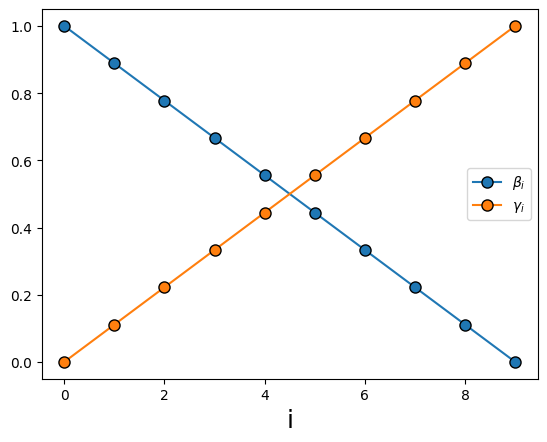

In [8]:
betas = np.linspace(0, 1, 10)[::-1]  # Parameters for the mixer Hamiltonian
gammas = np.linspace(0, 1, 10)  # Parameters for the cost Hamiltonian (Our Knapsack problem)

fig, ax = plt.subplots()
ax.plot(betas, label=r"$\beta_i$", marker="o", markersize=8, markeredgecolor="black")
ax.plot(gammas, label=r"$\gamma_i$", marker="o", markersize=8, markeredgecolor="black")
ax.set_xlabel("i", fontsize=18)
ax.legend()
fig.show()



This plot illustrates the opposing linear ramps for the $\beta_i$ and $\gamma_i$ parameters across the $p=10$ layers of our circuit.

- The mixer parameter $\beta_i$ starts at 1.0 and decreases linearly to 0. This ensures the algorithm begins by broadly exploring the entire solution space.
- The problem parameter $\gamma_i$ starts at 0 and increases linearly to 1.0. This gradually "turns on" the problem's cost function, guiding the search toward the optimal solution in later layers.

This schedule serves as a well-reasoned starting point for the classical optimizer, which will subsequently refine these angles to minimize the cost function.

### Inequality constraints
#### Slack variables



To solving the objective function on a quantum computer, it need to map it into the QUBO formulation, which uses binary variables $x_i \in \{0, 1\}$, into an **Ising model**. The Ising model is a more natural representation for quantum systems as it uses spin variables $z_i \in \{-1, 1\}$.

This conversion is achieved using the following transformation:
$$x_i = \frac{1 - z_i}{2}$$

Our goal is to map the QUBO's cost function into the general form of an Ising Hamiltonian:
$$H_c(z) = \sum_{i<j} J_{ij}z_i z_j + \sum_{i=1}^n h_i z_i + O$$
where **z ($z_i$)** is the spin variable for the i-th qubit, taking a value of either -1 or +1. The **J ($J_{ij}$)** term represents the quadratic interaction or coupling strength between a pair of spins ($z_i, z_j$), describing how they influence each other. The **h ($h_i$)** term is the linear bias or local field on an individual spin $z_i$, representing an external influence. Finally, **O** is a constant energy offset that does not change the optimal solution.

---
The Python function `from_Q_to_Ising` automates this conversion. It systematically iterates through each element of the QUBO matrix `Q` and applies the transformation to calculate the corresponding Ising parameters `h`, `J`, and the new energy offset. The output of this code gives us the final Hamiltonian for our problem, which can now be implemented in the QAOA circuit.

In [9]:
from collections import defaultdict

def from_Q_to_Ising(Q, offset):
    """Convert the matrix Q into elements J and h"""
    n_qubits = len(Q)  # Get the number of qubits (variables) in the QUBO matrix
    # Create default dictionaries to store h and pairwise interactions J
    h = defaultdict(int)
    J = defaultdict(int)

    # Loop over each qubit (variable) in the QUBO matrix
    for i in range(n_qubits):
        # Update the magnetic field for qubit i based on its diagonal element in Q
        h[(i,)] -= Q[i, i] / 2
        # Update the offset based on the diagonal element in Q
        offset += Q[i, i] / 2
        # Loop over other qubits (variables) to calculate pairwise interactions
        for j in range(i + 1, n_qubits):
            # Update the pairwise interaction strength (J) between qubits i and j
            J[(i, j)] += Q[i, j] / 4
            # Update the magnetic fields for qubits i and j based on their interactions in Q
            h[(i,)] -= Q[i, j] / 4
            h[(j,)] -= Q[i, j] / 4
            # Update the offset based on the interaction strength between qubits i and j
            offset += Q[i, j] / 4
    # Return the magnetic fields, pairwise interactions, and the updated offset
    return h, J, offset

h, J, zoffset = from_Q_to_Ising(QT, offset)  # Convert QUBO to Ising parameters


We can check if QUBO is well converted into Ising model by solving the resulting Ising model classically:

In [10]:
def energy_Ising(z, h, J, offset):
    """
    Calculate the energy of an Ising model given spin configurations.

    Parameters:
    - z: A dictionary representing the spin configurations for each qubit.
    - h: A dictionary representing the magnetic fields for each qubit.
    - J: A dictionary representing the pairwise interactions between qubits.
    - offset: An offset value.

    Returns:
    - energy: The total energy of the Ising model.
    """
    if isinstance(z, str):
        z = [(1 if int(i) == 0 else -1) for i in z]
    # Initialize the energy with the offset term
    energy = offset
    # Loop over the magnetic fields (h) for each qubit and update the energy
    for k, v in h.items():
        energy += v * z[k[0]]
    # Loop over the pairwise interactions (J) between qubits and update the energy
    for k, v in J.items():
        energy += v * z[k[0]] * z[k[1]]
    # Return the total energy of the Ising model
    return energy


# Our previous example should give us the same result
z_exp = [
    (1 if i == 0 else -1) for i in x_opt_slack
]  # Converting the optimal solution from (0,1) to (1, -1)
energy = energy_Ising(
    z_exp, h, J, zoffset
)  # Caluclating the energy (Should be the same that for the QUBO)
print(f"Minimum energy:{energy}")

Minimum energy:-250.0


We re-obtain the same result. Thus, it was well converted. 

Now, it is more interesting to test it with quantum algorithms:

In [11]:
# Run QAOA with the Hamiltonian
counts_slack = qaoa_circuit_qiskit(gammas, betas, h, J, num_qubits=len(QT), shots=5000)

The `analyze_counts`function filters the raw results from the quantum circuit, discarding any solution that violates the maximum budget constraint of $100K. It then returns a new dictionary that maps each valid solution's total Social Impact value to the number of times it was measured.

In [12]:
def analyze_counts(counts, values_list, weights_list, maximum_weight):
    values_dict = {
        sum_values(sample_i[::-1], values_list): count
        for sample_i, count in counts.items()
        if sum_weight(sample_i[::-1], weights_list) <= maximum_weight
    }
    return values_dict

values_slack = analyze_counts(counts_slack, values_list, weights_list, maximum_weight)

C:\Users\binhv\AppData\Local\Temp\ipykernel_14184\1154739819.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


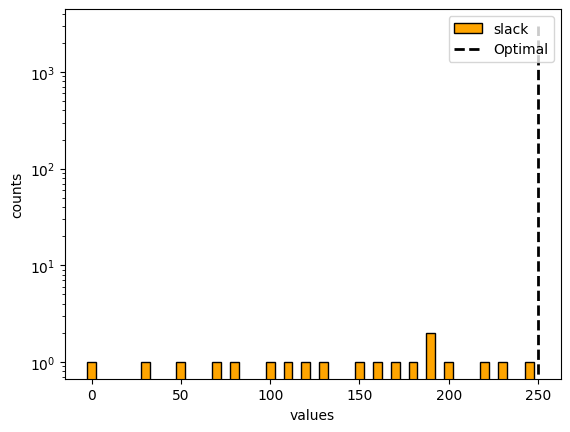

In [13]:
fig, ax = plt.subplots()
ax.hist(
    values_slack.keys(),
    weights=values_slack.values(),
    bins=50,
    edgecolor="black",
    color="orange",
    label="slack",
    align="left",
)
ax.vlines(-cost, 0, 3000, linestyle="--", color="black", label="Optimal", linewidth=2)
ax.set_yscale("log")
ax.legend()
ax.set_ylabel("counts")
ax.set_xlabel("values")
fig.show()

This histogram shows the distribution of valid solutions found by our QAOA algorithm, comparing them against the known best answer .i.e. 250.

As shown, only a small fraction of the 5000 measurement shots produces the correct solution, even though there are only \(2^5 = 32\) possible configurations. 

By random sampling, one would expect approximately $\frac{5000}{32} \approx 156$ optimal solutions. The poor performance of QAOA in this setting could be attributed to the algorithm itself; however, a closer examination reveals that the primary issue arises from the encoding strategy.  

When slack variables are introduced (5 decision variables + 5 slack variables), the search space increases to 
$2^{12} = 4096$ configurations. Under random guessing, this corresponds to an expectation of 
$\frac{5000}{4096} \approx 1.22$ optimal solutions. Hence, the observed performance improvement is marginal.

To achieve better results, we would need to increase the number of shots, which means running the algorithm on more powerful simulators, such as those using GPUs. However, this is still just a simulation for 5 projects (only one-quarter of the full list). The main reason is that we require 7 qubits to encode the inequality constraints with slack variables—this is even more qubits than the 5 needed to represent the projects themselves. Since the number of available qubits on real hardware remains very limited, it is essential to minimize qubit usage as much as possible. This is precisely why the **unbalanced penalization** method was introduced.



#### Unbalanced penalization

The **unbalanced penalization** method, first introduced in [2,3], is designed to handle inequality constraints more efficiently. Unlike the slack-variable approach, it does not require introducing additional qubits. The key idea is to apply an asymmetric penalty: violations of the inequality constraint are penalized more heavily than cases where the constraint is satisfied. This imbalance ensures that feasible solutions are favored while reducing the number of qubits needed for encoding, making the method more suitable for larger-scale problems on near-term quantum hardware. With unbalanced penalties, the objective function becomes [4]:

$$\min_{x,s}f(x)+p(\lambda,x,s)=\min_{x,s}\left[-\sum_i v_i x_i -\lambda_1(\sum_iw_ix_i-W)^2+\lambda_2(\sum_iw_ix_i-W)^2\right]$$

where $\lambda_{i}$ ($i=1$ or $2$) are again penalty coefficients, which are proved to have good results for slack problem for Knack sack problem with $\lambda_1=0.9603$ and $\lambda_1=0.0371$ in [2]. 


##### Putting everthing together in a Reusable Model

The entire process, from defining a high-level optimization problem to solving it with QAOA, can be encapsulated into a single, reusable model. By combining the Docplex problem definition from OpenQAOA package, the automated conversion to a QUBO/Ising representation, and the execution of the QAOA algorithm, we create a model that can be modified later depeding upon the need.


In [15]:
from docplex.mp.model import Model
from openqaoa.problems import FromDocplex2IsingModel

def Knapsack(values, weights, maximum_weight):
    n_items = len(values)
    mdl = Model()
    x = mdl.binary_var_list(range(n_items), name="x")
    cost = -mdl.sum(x[i] * values[i] for i in range(n_items)) # Objective function
    mdl.minimize(cost) # Minimize the objective function
    mdl.add_constraint(mdl.sum(x[i] * weights[i] for i in range(n_items)) <= maximum_weight) # Inequality constraint
    return mdl

##### Compiling the Problem into a QAOA-Ready Hamiltonian

We encapsulate the entire pre-processing pipeline into a single function, `Knapsack_model`. It serves as a "compiler" that translates our high-level problem definition directly into the low-level Ising Hamiltonian required by the QAOA circuit.

The function performs three key steps:
1.  It first calls our `Knapsack` function to create a structured Docplex model of the problem.
2.  It then uses the `FromDocplex2IsingModel` tool from the `openqaoa` library to automatically convert this model into an Ising Hamiltonian. This is the most critical step, as it handles the complex task of encoding the knapsack's weight constraint (`<= maximum_weight`) into the Hamiltonian using penalty terms.
3.  Finally, it parses the output and organizes it into the `h` (linear) and `J` (quadratic) dictionaries, which is the precise format our QAOA circuit function expects as input.

In [16]:
def Knapsack_model(values_list, weights_list, maximum_weight, lambda_1=0.96, lambda_2=0.0371):

    mdl = Knapsack(values_list, weights_list, maximum_weight)

    ising_hamiltonian = FromDocplex2IsingModel(
        mdl,
        unbalanced_const=True,
        strength_ineq=[lambda_1, lambda_2]
    ).ising_model

    h_new = {
        tuple(i): w for i, w in zip(ising_hamiltonian.terms, ising_hamiltonian.weights) if len(i) == 1
    }
    J_new = {
        tuple(i): w for i, w in zip(ising_hamiltonian.terms, ising_hamiltonian.weights) if len(i) == 2
    }
    return h_new, J_new

h_new, J_new = Knapsack_model(values_list, weights_list, maximum_weight)



-- cannot find parameters matching version: , using: 22.1.1.0
-- cannot find parameters matching version: , using: 22.1.1.0


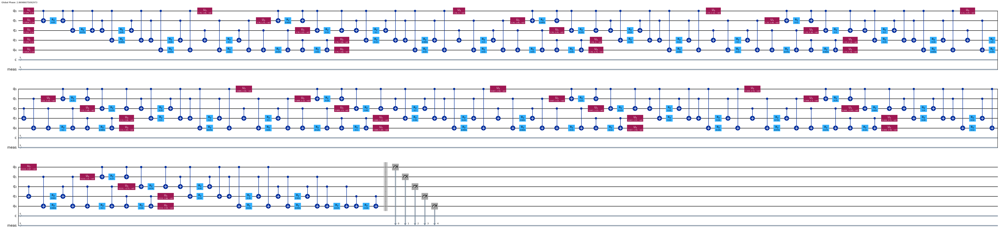

In [17]:
counts_unbalanced = qaoa_circuit_qiskit(gammas, betas, h_new, J_new, num_qubits=n_items, shots=5000)

In [18]:
values_unbalanced = analyze_counts(counts_unbalanced, values_list, weights_list, maximum_weight)


Text(0.5, 0, 'values')

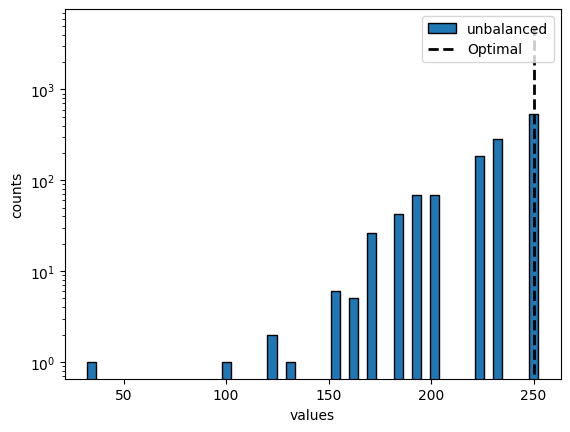

In [19]:
fig, ax = plt.subplots()
ax.hist(
    values_unbalanced.keys(),
    weights=values_unbalanced.values(),
    bins=50,
    edgecolor="black",
    label="unbalanced",
    align="right",
)
ax.vlines(-min_cost, 0, 5000, linestyle="--", color="black", label="Optimal", linewidth=2)
ax.set_yscale("log")
ax.legend()
ax.set_ylabel("counts")
ax.set_xlabel("values")

We improved the QAOA solution by encoding our QUBO more effectively, obtaining nearly 464 optimal solutions out of 5000 samples.  
Below, we compare two different encoding methods for the problem.  

- The **x-axis** represents the total value of the selected items (higher values are better).  
- The **y-axis** shows the number of samples achieving each value (plotted on a logarithmic scale to better illustrate the slack-variable approach).  

From this perspective, QAOA clearly emphasizes the optimal and suboptimal solutions.


##### Comparaison

C:\Users\binhv\AppData\Local\Temp\ipykernel_14184\1599461157.py:23: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


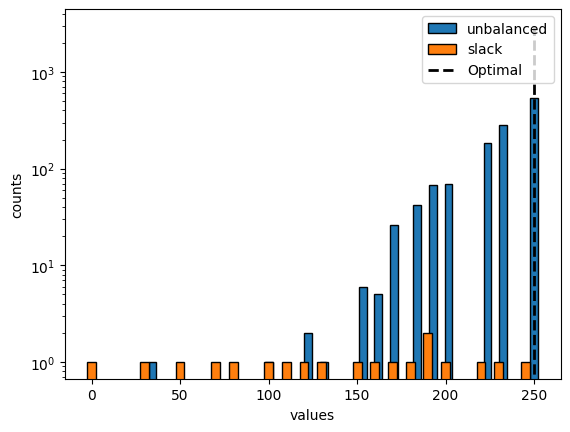

In [20]:
fig, ax = plt.subplots()
ax.hist(
    values_unbalanced.keys(),
    weights=values_unbalanced.values(),
    bins=50,
    edgecolor="black",
    label="unbalanced",
    align="right",
)
ax.hist(
    values_slack.keys(),
    weights=values_slack.values(),
    bins=50,
    edgecolor="black",
    label="slack",
    align="left",
)
ax.vlines(-cost, 0, 3000, linestyle="--", color="black", label="Optimal", linewidth=2)
ax.set_yscale("log")
ax.legend()
ax.set_ylabel("counts")
ax.set_xlabel("values")
fig.show()
# Add this after plt.show() or before
fig.savefig('histogram_comparison.jpg', dpi=100, bbox_inches='tight', format='jpeg')

With using less number of qubits (only 5) and the same amount of shots (5000), the unbalanced penalization method significantly increases the number of chance to obtain the optimal solution compared to the slack variable method.



## More number of items
We finally extend our work for our original problem: Finding the best overall Impact value returning combination of projects.

We exted our model for 20 projects with the budget constraint of $100k.

In [40]:


items_values_more = {
    "🚰": 80,   # Clean Water
    "📖": 50,   # Literacy Program
    "🔋": 120,  # Renewable Energy
    "🍽️": 70,  # Food Security
    "🧠": 30,   # Mental Health
    "🌳": 65,   # Urban Greening
    "🎓": 90,   # STEM Education
    "🏥": 110,  # Mobile Clinics
    "🧪": 40,   # Disease Research
    "🎭": 25,   # Arts Access
    "🧼": 35,   # Hygiene Kits
    "🌍": 95,   # Climate Action
    "📡": 60,   # Rural Internet
    "🚸": 45,   # Child Safety
    "🧯": 55,   # Fire Prevention
    "📦": 20,   # Disaster Relief
    "🧃": 15,   # School Nutrition
    "🧩": 85,   # Disability Inclusion
    "🧤": 10,   # Winter Clothing
    "🧬": 75    # Genetic Health Equity
}

items_weight_more = {
    "🚰": 30,
    "📖": 20,
    "🔋": 50,
    "🍽️": 40,
    "🧠": 10,
    "🌳": 25,
    "🎓": 35,
    "🏥": 45,
    "🧪": 15,
    "🎭": 10,
    "🧼": 12,
    "🌍": 38,
    "📡": 22,
    "🚸": 18,
    "🧯": 20,
    "📦": 8,
    "🧃": 5,
    "🧩": 30,
    "🧤": 4,
    "🧬": 28
}

values_list_more = list(items_values_more.values())
weights_list_more = list(items_weight_more.values())

maximum_weight = 100  # We keep the same budget constraint

n_items_more = len(values_list_more)


### Optimal Solution for Social Impact Funding with classical algorithms

In [34]:
optimal_solution_more = classical_combinations(items_values_more, weights_list_more, values_list_more, maximum_weight)
print(
    f"The best combination is {optimal_solution_more['items']} with a total value: {optimal_solution_more['value']} and total weight {optimal_solution['weight']} "
)

The best combination is ['🧠', '🧼', '🧯', '🧩', '🧬'] with a total value: 280 and total weight 100 




The classical solver has found the optimal combination of projects that maximizes social value while adhering to the budget constraint.

This result represents the most efficient allocation of resources to maximize community benefit. The optimal portfolio of projects to fund is:

* Maximum Social Value Achieved: 280
* Total Cost: 100
* Selected Projects to Fund:
    * 🧠 Mental Health
    * 🧼 Hygiene Kits
    * 🧯 Fire Prevention
    * 🧩 Disability Inclusion
    * 🧬 Genetic Health Equity

In [46]:
h_more, J_more = Knapsack_model(values_list_more, weights_list_more, maximum_weight)



-- cannot find parameters matching version: , using: 22.1.1.0
-- cannot find parameters matching version: , using: 22.1.1.0


### Quantum Circuit Implementation with the unbalanced penalization

In [61]:
counts_more = qaoa_circuit_qiskit(gammas, betas, h_more, J_more, num_qubits=n_items_more, shots=1000000)

In [62]:
values_unbalanced_more = analyze_counts(counts_more, values_list_more, weights_list_more, maximum_weight)


C:\Users\binhv\AppData\Local\Temp\ipykernel_14844\64365199.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


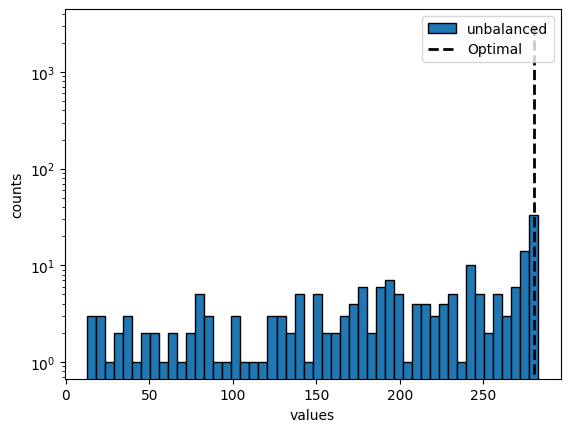

In [63]:
fig, ax = plt.subplots()
ax.hist(
    values_unbalanced_more.keys(),
    weights=values_unbalanced_more.values(),
    bins=50,
    edgecolor="black",
    label="unbalanced",
    align="right",
)

ax.vlines(optimal_solution_more['value'], 0, 3000, linestyle="--", color="black", label="Optimal", linewidth=2)
ax.set_yscale("log")
ax.legend()
ax.set_ylabel("counts")
ax.set_xlabel("values")
fig.show()

In [64]:
1000000/2**20

0.95367431640625

In [65]:
2**20

1048576

In [66]:
values_unbalanced_more

{250: 2,
 265: 6,
 170: 4,
 185: 6,
 230: 5,
 225: 4,
 190: 7,
 255: 5,
 195: 5,
 240: 10,
 235: 1,
 270: 14,
 260: 3,
 155: 2,
 200: 1,
 245: 5,
 215: 2,
 175: 6,
 160: 2,
 125: 3,
 205: 4,
 165: 3,
 220: 3,
 80: 3,
 210: 2,
 150: 3,
 140: 1,
 75: 2,
 95: 1,
 135: 5,
 100: 3,
 105: 1,
 145: 2,
 115: 1,
 130: 2,
 180: 2,
 85: 3,
 275: 12,
 110: 1,
 280: 21,
 65: 1,
 120: 3,
 90: 1,
 70: 2,
 35: 3,
 40: 1,
 45: 2,
 25: 1,
 30: 2,
 55: 1,
 15: 2,
 60: 2,
 10: 1,
 20: 3,
 50: 2}

The search space increases to 
$2^{20} = 1048576$ configurations for 20 projects. Thus, we need to increase the number of shots also to 1M or more. Under random guessing, this corresponds to an expectation of $\frac{5000}{4096} \approx 0.95$. With it, we get 21 optimal solution over 1M shots. We can improve the result with more shots. 

## References
[1] Farhi, E., Goldstone, J., & Gutmann, S. (2014). A Quantum Approximate Optimization Algorithm. http://arxiv.org/abs/1411.4028

[2] Montanez-Barrera, A., Willsch, D., A., Maldonado-Romo, & Michielsen, K. (2022). Unbalanced penalization: A new approach to encode inequality constraints of combinatorial problems for quantum optimization algorithms. http://arxiv.org/abs/2211.13914

[3] Montanez-Barrera, J. A., Heuvel, P. van den, Willsch, D., & Michielsen, K. (2023). Improving Performance in Combinatorial Optimization Problems with Inequality Constraints: An Evaluation of the Unbalanced Penalization Method on D-Wave Advantage. https://doi.org/10.1109/QCE57702.2023.00067

[4] A. Montanez, "Quadratic Unconstrained Binary Optimization tutorial," Pennylane.ai, Feb. 28, 2024. [Online]. Available: https://pennylane.ai/qml/demos/tutorial_QUBO. [Accessed: Sep. 14, 2025].
